In [ ]:
#We need to identify when ball is kicked or dribbled

https://www.youtube.com/watch?v=P5FTEryiTl4

https://github.com/bnsreenu/python_for_microscopists/blob/master/118_object_detection_by_template_matching.py

In [ ]:
# MTM : multiple template matching
from google.colab import drive
drive.mount("/MTM")


Mounted at /MTM


In [ ]:
import tensorflow as tf
from tensorflow.keras.applications import VGG16
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.layers import Input
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from keras.models import Sequential
from keras.layers import Conv2D
from keras.layers import MaxPooling2D
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.image import load_img
import cv2
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras import layers, models, optimizers
from tensorflow.keras.utils import to_categorical
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelBinarizer
import numpy as np
import pandas as pd
import cv2
import os
import imutils
from google.colab.patches import cv2_imshow
import pickle
import seaborn as sn
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sn
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import math
import datetime
import platform

from matplotlib import pyplot as plt

In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 660.1/660.1 kB 5.1 MB/s eta 0:00:00


In [ ]:

!pip install Multi-Template-Matching


In [ ]:
!pip install opencv-python

In [ ]:
import MTM
from MTM import matchTemplates
import matplotlib.pyplot as plt
from MTM import drawBoxesOnRGB

# Multiple template matchin on single Frame

In [205]:

def Multiple_Template_On_Image(template_folder, Frame):
  listTemplate=[]
  for filename in os.listdir(template_folder):
      template_img = cv2.imread(os.path.join(template_folder, filename))
      template_img = cv2.cvtColor(template_img, cv2.COLOR_BGR2GRAY)
      listTemplate.append((filename.split('.')[0], template_img))


  input_img=cv2.imread(Frame)
  input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY)
  hits = matchTemplates(listTemplate,
                  input_img,
                  score_threshold=0.75,
                  searchBox=(0, 0, 3000, 750),
                  method=cv2.TM_CCOEFF_NORMED,
                  maxOverlap=0.1)

  return hits


# Display_template_matching_output

In [212]:

def Display_template_matching_output(hits,frame):
  input_img=cv2.imread(frame)
  overlay = drawBoxesOnRGB(input_img,
                          hits,
                          showLabel = True,
                          labelColor=( 0, 0,255),
                          boxColor = (255, 0, 0),
                          labelScale=1.5,
                          boxThickness = 1)

  cv2_imshow(overlay)
  cv2.waitKey()
  cv2.destroyAllWindows()


# Extract BBOX and body keypoints using yolov8

In [200]:
from ultralytics import YOLO
# Load a model
model = YOLO('https://github.com/ultralytics/assets/releases/download/v0.0.0/yolov8x-pose-p6.pt')
def Extract_BBOX(image_path):
  keypoint_17=[]

  #  Display an image
  result = model.predict(image_path,conf=0.6)[0]
  a_f=result.plot()
  cv2_imshow(a_f)
  print("asd : ",len(result.keypoints.data))
  bbox_all=[]
  for k in range(len(result.keypoints.data)):
    keypoints = result.keypoints.xy[k].tolist()
    bbox = result.boxes.xyxy[k].tolist()
    bbox_all.append((int(bbox[0]),int(bbox[1]),int(bbox[2]),int(bbox[3])))
    # print("boxes : ",bbox)
    keypoint_17.append(keypoints)
  return bbox_all, keypoint_17



Found https://github.com/ultralytics/assets/releases/download/v0.0.0/yolov8x-pose-p6.pt locally at yolov8x-pose-p6.pt


# Mapping Templates to the bbox of player

In [210]:
def Mapping_To_BBOX_Body_Keypoints(template_df,body_keypoints,body_bbox):
  print("body_bbox  body_bbox   : ",body_bbox)
  template_bbox=[]
  template_bbox = template_df["BBox"].tolist()
  for bbox in template_df["BBox"]:
    template_bbox.append(bbox)
  print("len(template_bbox) : ",len(template_bbox))
  template_df['body_keypoints']=''
  template_df['body_bbox']=''
  # print("template_df : \n",template_df)
  cnt=0
  for keypoints in body_keypoints:
    cnt+=1
    # print(keypoints)
    nose       = keypoints[0][0],  keypoints[0][1]
    l_eye      = keypoints[1][0],  keypoints[1][1]
    r_eye      = keypoints[2][0],  keypoints[2][1]
    # print("nose,l_eye,r_eye  :  ",nose,l_eye,r_eye)

    ck=0
    for bbox in template_bbox:
      xmin, ymin, width, height = bbox
      xmax = xmin + width
      ymax = ymin + height
      # print("00000000000  xmin,ymin,xmax,ymax : ",xmin,ymin,xmax,ymax)
      if xmin <= nose[0] <= xmax and ymin <= nose[1] <= ymax:
        ck=1
        break
      elif xmin <= l_eye[0] <= xmax and ymin <= l_eye[1] <= ymax:
        ck=1
        break
      elif xmin <= r_eye[0] <= xmax and ymin <= r_eye[1] <= ymax:
        ck=1
        break
    if(ck==1):
      # Use apply to update 'body_keypoints' for matching rows
      template_df['body_keypoints'] = template_df.apply(
                lambda row: keypoints if (row['BBox'] == bbox) else row['body_keypoints'],
                axis=1)
      template_df['body_bbox'] = template_df.apply(
                lambda row: body_bbox[cnt-1] if (row['BBox'] == bbox) else row['body_bbox'],
                axis=1)

    # This for template_bbox and body_bbox comparing
    if(nose[0]<=0 and ck==0 and l_eye[0]<=0 and r_eye[0]<=0):
      # print("nose[0]  nose[0]  nose[0] : ",nose[0])
      # print(" bbox ------------------",body_bbox[cnt-1],"     cnt-1 : ",cnt-1)
      xmin_b=body_bbox[cnt-1][0]
      ymin_b=body_bbox[cnt-1][1]
      xmax_b = xmin_b + body_bbox[cnt-1][2]
      ymax_b = ymin_b + body_bbox[cnt-1][3]

      ck=1
      for bbox in template_bbox:
        ck=1
        xmin, ymin, width, height = bbox
        xmax = xmin + width
        ymax = ymin + height
        # print("xmin_b,ymin_b,xmax_b,ymax_b       body  : ",xmin_b,ymin_b,xmax_b,ymax_b)
        # print("xmin, ymin, width, height template_bbox : ",xmin, ymin, xmax, ymax)

        # print("xmin_b <= xmin <= xmax_b : ",xmin_b , xmin , xmax_b)
        # print("ymin_b <= ymin <= ymax_b : ",ymin_b , ymin , ymax_b)
        # print("xmin_b <= xmax <= xmax_b : ",xmin_b , xmax , xmax_b)
        # print("ymin_b <= ymax <= ymax_b : ",ymin_b , ymax , ymax_b)
        # print("-------------------------------------------------------------")
        if((xmin_b <= xmin <= xmax_b) and (ymin_b <= ymin <= ymax_b) and (xmin_b <= xmax <= xmax_b) and (ymin_b <= ymax <= ymax_b)):
          ck=0
          # print("yesssssssssssssssssssssssssssssssssssssssssssssssss bbox : ",bbox,"   template_df[BBox] : ",template_df["BBox"])
          template_df['body_keypoints'] = template_df.apply(
                  lambda row: keypoints if (row['BBox'] == bbox) else row['body_keypoints'],
                  axis=1)
          template_df['body_bbox'] = template_df.apply(
                  lambda row: body_bbox[cnt-1] if (row['BBox'] == bbox) else row['body_bbox'],
                axis=1)

  return template_df

# (xmin, xmax, xmax, ymax)  TO (xmin, ymin, width, height)

In [ ]:
def standard_bbox(bbox):
  bboxes=[]
  for box in bbox:
    x1,y1,x2,y2=box
    w=x2-x1
    h=y2-y1
    # print(x1,y1,x2,y2)
    # print(x1,y1,w,h)
    bboxes.append((x1,y1,w,h))
  return bboxes



# Insert body_bbox, body_keypoints, template_bbox information in one csv file

In [ ]:

def Insert_bbox_keypoints_frame_by_frame(frame,df,bbox_points_df):
  template_bbox_l=[]
  body_keypoints_l=[]
  body_BBox_l=[]
  for i in range(len(df["TemplateName"])):
    tmp_name=df["TemplateName"][i]

    template_bbox_dict={tmp_name:df["template_bbox"][i]}
    body_keypoints_dict={tmp_name:df["body_keypoints"][i]}
    body_BBox_dict={tmp_name:df["BBox"][i]}

    template_bbox_l.append(template_bbox_dict)
    body_keypoints_l.append(body_keypoints_dict)
    body_BBox_l.append(body_BBox_dict)

  bbox_points_df.loc[frame] = [template_bbox_l,body_keypoints_l,body_BBox_l]
  return bbox_points_df


In [187]:
Images_folderpath = "/MTM/MyDrive/template_matching/video/Leo_Frames"


images = []
for img in os.listdir(Images_folderpath):
    images.append(os.path.join(Images_folderpath, img))


In [188]:
batch_size = 30
imgs = []
for i in range(batch_size):
    imgs.append(images[i])
print(len(imgs))

30


# Call Multiple_Template_On_Image  function


image 1/1 /MTM/MyDrive/template_matching/video/Leo_Frames/frame_0136.png: 768x1280 2 persons, 12088.6ms
Speed: 14.8ms preprocess, 12088.6ms inference, 2.6ms postprocess per image at shape (1, 3, 768, 1280)


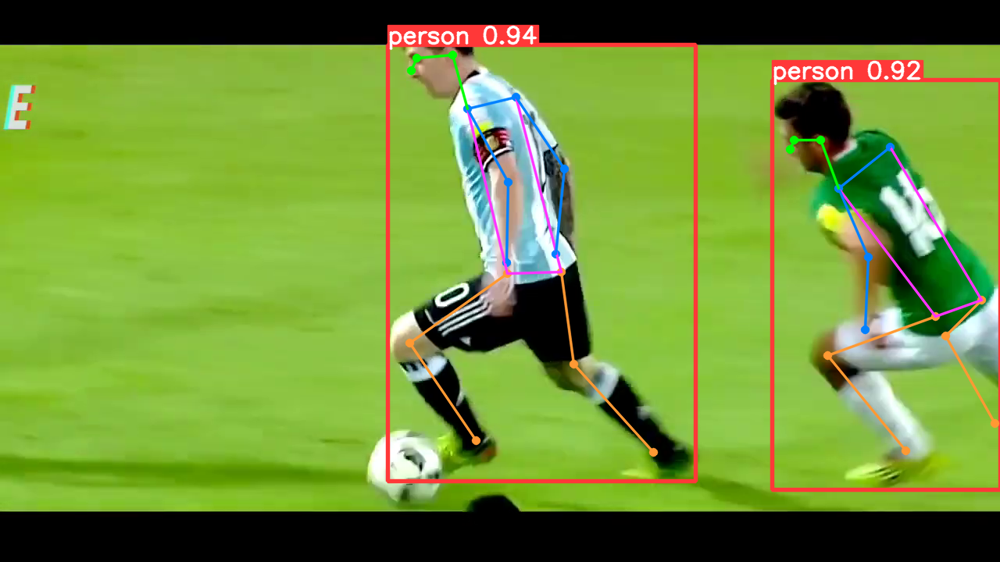

asd :  2
body_bbox  body_bbox   :  [(496, 57, 394, 559), (988, 102, 292, 525)]
len(template_bbox) :  4
------------ body_keypoints      TemplateName      template_bbox     Score  \
0      Messi_L  (525, 40, 86, 92)  0.762396   

                                      body_keypoints                 BBox  
0  [[526.82666015625, 90.334716796875], [533.0944...  (496, 57, 394, 559)  


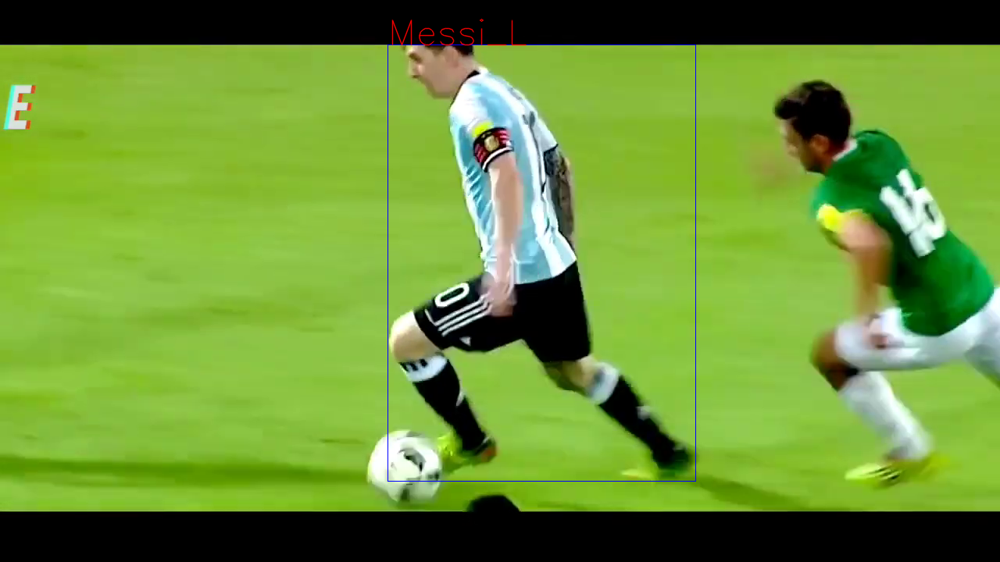


image 1/1 /MTM/MyDrive/template_matching/video/Leo_Frames/frame_0137.png: 768x1280 2 persons, 9709.0ms
Speed: 6.9ms preprocess, 9709.0ms inference, 1.5ms postprocess per image at shape (1, 3, 768, 1280)


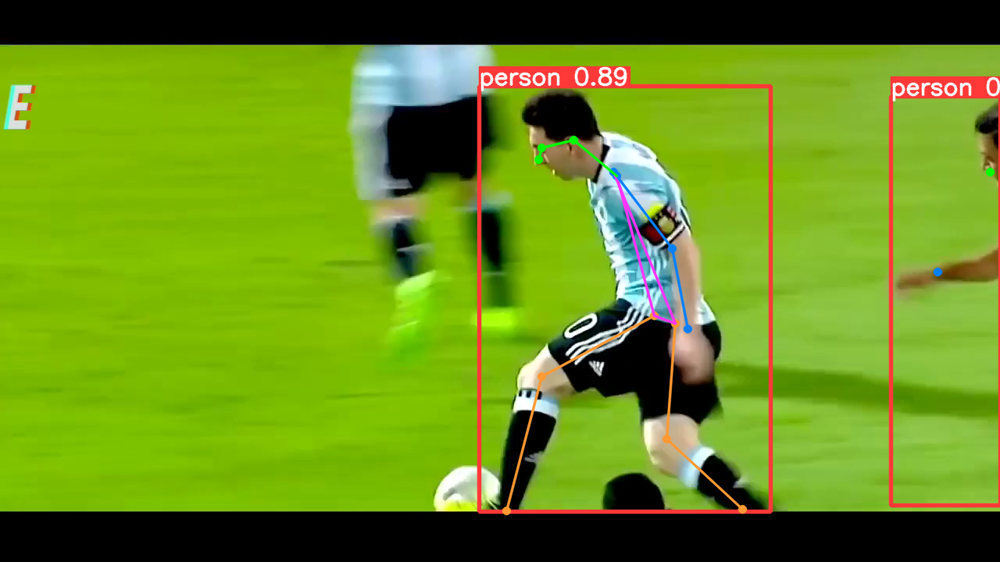

asd :  2
body_bbox  body_bbox   :  [(613, 110, 373, 545), (1140, 123, 140, 524)]
len(template_bbox) :  2
------------ body_keypoints      TemplateName       template_bbox     Score  \
0      Messi_L  (665, 147, 86, 92)  0.760312   

                                      body_keypoints                  BBox  
0  [[689.9033203125, 204.15960693359375], [693.98...  (613, 110, 373, 545)  


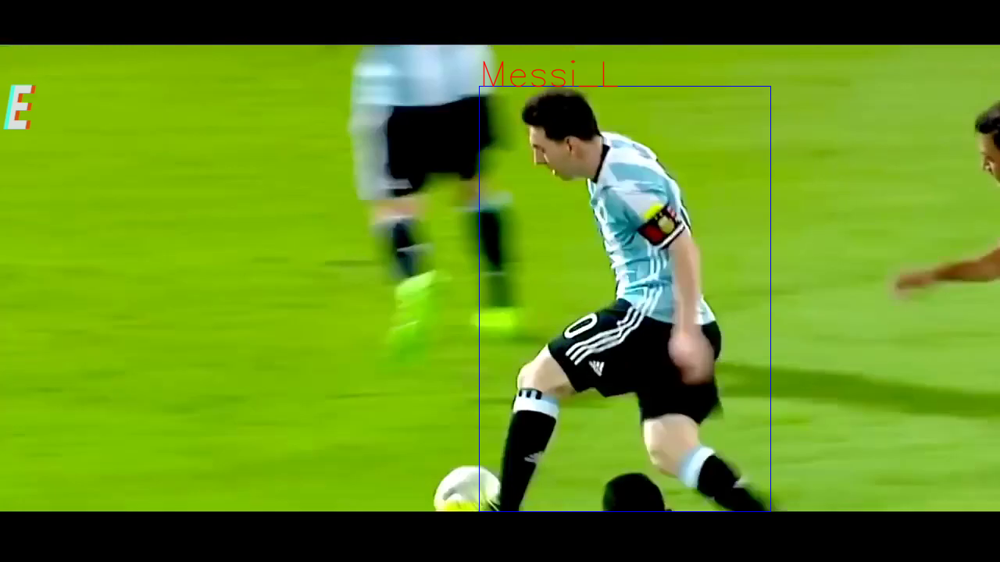


image 1/1 /MTM/MyDrive/template_matching/video/Leo_Frames/frame_0138.png: 768x1280 4 persons, 12049.2ms
Speed: 13.9ms preprocess, 12049.2ms inference, 1.8ms postprocess per image at shape (1, 3, 768, 1280)


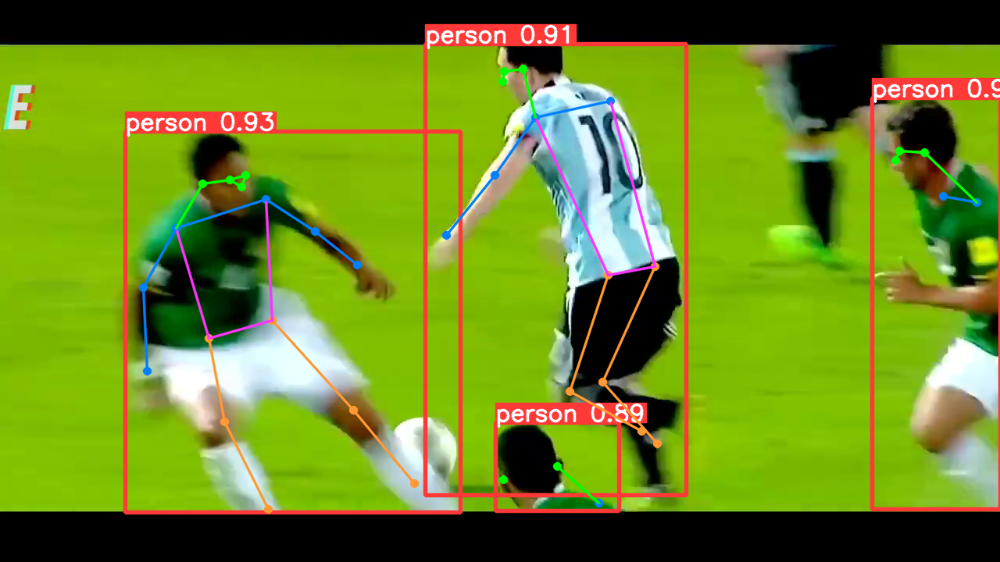

asd :  4
body_bbox  body_bbox   :  [(1116, 125, 164, 527), (160, 168, 429, 488), (544, 56, 334, 578), (634, 541, 158, 113)]
len(template_bbox) :  6
------------ body_keypoints      TemplateName      template_bbox     Score  \
0      Messi_L  (615, 52, 86, 92)  0.818396   

                                      body_keypoints                 BBox  
0  [[643.9451293945312, 104.32292175292969], [645...  (544, 56, 334, 578)  


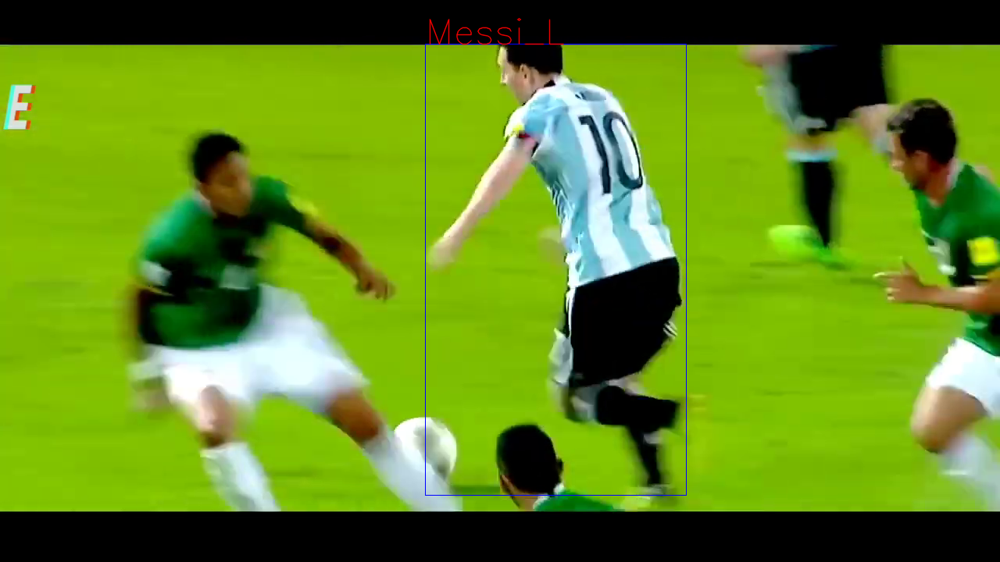

In [216]:
template_folder ="/MTM/MyDrive/template_matching/images/messi_templates"
input_img="/MTM/MyDrive/template_matching/video/Leo_Frames/frame_0029.png"
for i in range(3):
  val=136+i
  input_img="/MTM/MyDrive/template_matching/video/Leo_Frames/frame_0"+str(val)+".png"
  hits = Multiple_Template_On_Image(template_folder, input_img)
  body_bbox,body_keypoints=Extract_BBOX(input_img)
  body_bbox=standard_bbox(body_bbox)
  # print(body_keypoints)
  # print("body_bbox : ",body_bbox)
  df = Mapping_To_BBOX_Body_Keypoints(hits,body_keypoints,body_bbox)
  # Rename the 'OldColumn' to 'NewColumn'
  df.rename(columns={'BBox': 'template_bbox'}, inplace=True)
  df.rename(columns={'body_bbox': 'BBox'}, inplace=True)
  df['BBox'].replace('', np.nan, inplace=True)
  df=df.dropna()
  print("------------ body_keypoints   ",df)
  # df=df.dropna()
  Display_template_matching_output(df,input_img)


image 1/1 /MTM/MyDrive/template_matching/video/Leo_Frames/frame_0085.png: 768x1280 5 persons, 12321.5ms
Speed: 13.7ms preprocess, 12321.5ms inference, 1.6ms postprocess per image at shape (1, 3, 768, 1280)
asd :  5
body_bbox  body_bbox   :  [(714, 104, 367, 544), (442, 163, 257, 485), (2, 126, 489, 525), (13, 176, 117, 200), (313, 329, 86, 89)]
len(template_bbox) :  110
------------ body_keypoints        TemplateName        template_bbox     Score  \
74       Messi_L   (511, 544, 86, 92)  0.727163   
15       Messi_R    (36, 153, 67, 83)  0.592889   
18       Messi_R    (870, 89, 67, 83)  0.585505   
215     Messi_B1  (475, 413, 67, 127)  0.530635   
218     Messi_B1  (570, 278, 67, 127)  0.503004   

                                        body_keypoints                  BBox  
74   [[0.0, 0.0], [0.0, 0.0], [0.0, 0.0], [585.8956...  (442, 163, 257, 485)  
15   [[77.52867126464844, 211.94342041015625], [85....   (13, 176, 117, 200)  
18   [[900.1151733398438, 140.42413330078125], [911

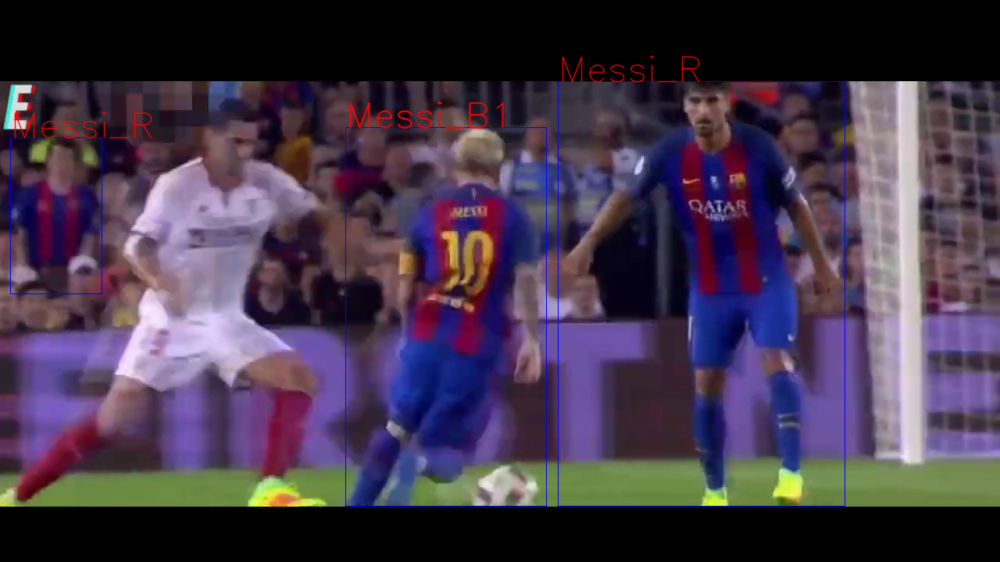


image 1/1 /MTM/MyDrive/template_matching/video/Leo_Frames/frame_0113.png: 768x1280 4 persons, 10715.9ms
Speed: 6.2ms preprocess, 10715.9ms inference, 2.0ms postprocess per image at shape (1, 3, 768, 1280)
asd :  4
body_bbox  body_bbox   :  [(756, 98, 214, 434), (364, 133, 115, 319), (74, 150, 136, 398), (519, 100, 278, 454)]
len(template_bbox) :  80
------------ body_keypoints        TemplateName      template_bbox     Score  \
26       Messi_R  (882, 89, 67, 83)  0.556326   
101      Messi_L  (343, 77, 86, 92)  0.535952   
48       Messi_R  (657, 92, 67, 83)  0.516422   

                                        body_keypoints                  BBox  
26   [[914.0524291992188, 145.82125854492188], [925...   (756, 98, 214, 434)  
101  [[417.73028564453125, 164.96664428710938], [42...  (364, 133, 115, 319)  
48   [[702.1632690429688, 151.43223571777344], [710...  (519, 100, 278, 454)  


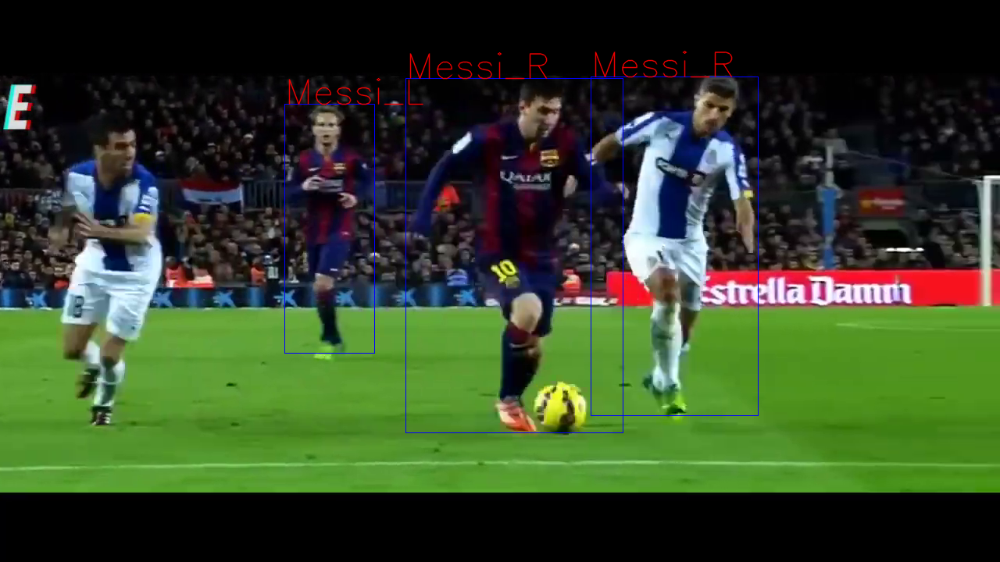


image 1/1 /MTM/MyDrive/template_matching/video/Leo_Frames/frame_0114.png: 768x1280 1 person, 10337.0ms
Speed: 7.2ms preprocess, 10337.0ms inference, 1.5ms postprocess per image at shape (1, 3, 768, 1280)
asd :  1
body_bbox  body_bbox   :  [(70, 101, 347, 522)]
len(template_bbox) :  136
------------ body_keypoints        TemplateName       template_bbox     Score  \
144      Messi_L  (101, 266, 86, 92)  0.741666   
146      Messi_L  (267, 316, 86, 92)  0.722667   
20       Messi_R  (322, 407, 67, 83)  0.652423   
338     Messi_F1  (263, 217, 87, 97)  0.648610   
23       Messi_R  (263, 408, 67, 83)  0.646394   
38       Messi_R  (306, 472, 67, 83)  0.626509   
245      Messi_L  (199, 185, 86, 92)  0.574599   
354     Messi_B2  (165, 331, 68, 95)  0.569216   
340     Messi_F1  (162, 418, 87, 97)  0.568858   

                                        body_keypoints                 BBox  
144  [[0.0, 0.0], [0.0, 0.0], [0.0, 0.0], [0.0, 0.0...  (70, 101, 347, 522)  
146  [[0.0, 0.0], [0.0, 

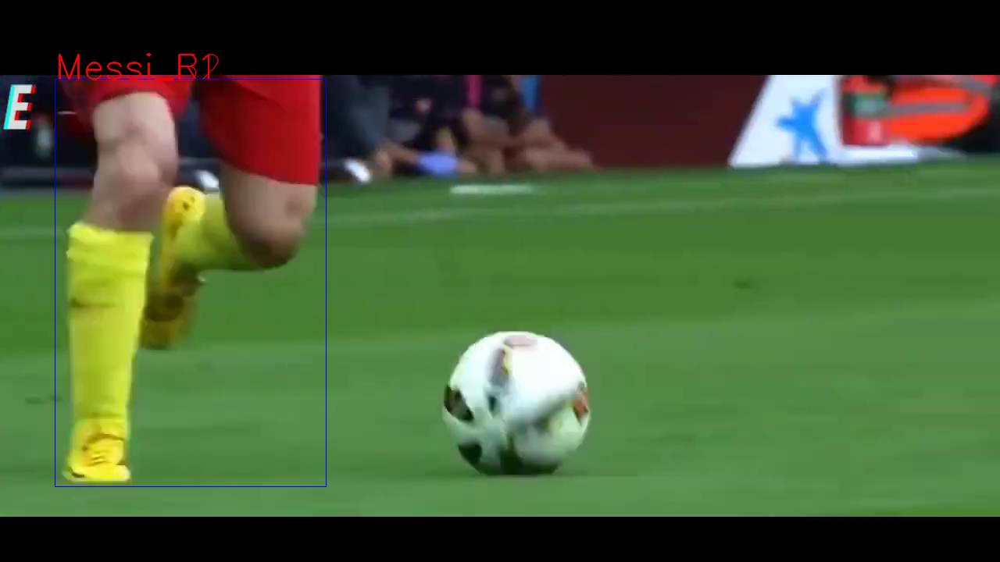


image 1/1 /MTM/MyDrive/template_matching/video/Leo_Frames/frame_0112.png: 768x1280 3 persons, 12125.3ms
Speed: 7.4ms preprocess, 12125.3ms inference, 1.9ms postprocess per image at shape (1, 3, 768, 1280)
asd :  3
body_bbox  body_bbox   :  [(407, 219, 282, 353), (727, 97, 323, 443), (965, 97, 238, 436)]
len(template_bbox) :  72
------------ body_keypoints       TemplateName       template_bbox     Score  \
0       Messi_R   (843, 74, 67, 83)  0.680925   
1       Messi_R  (493, 408, 67, 83)  0.628394   
4       Messi_R  (523, 333, 67, 83)  0.583108   
48      Messi_R  (1085, 90, 67, 83)  0.516038   

                                       body_keypoints                  BBox  
0   [[898.9215698242188, 134.28045654296875], [906...   (727, 97, 323, 443)  
1   [[0.0, 0.0], [0.0, 0.0], [0.0, 0.0], [448.3140...  (407, 219, 282, 353)  
4   [[0.0, 0.0], [0.0, 0.0], [0.0, 0.0], [448.3140...  (407, 219, 282, 353)  
48  [[1113.485595703125, 149.2738800048828], [1125...   (965, 97, 238, 436)  


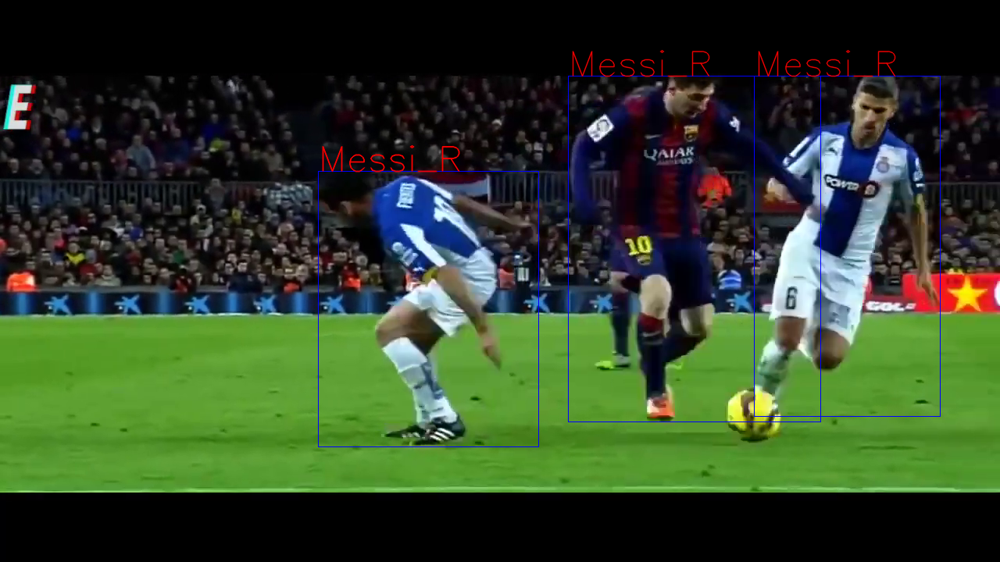


image 1/1 /MTM/MyDrive/template_matching/video/Leo_Frames/frame_0110.png: 768x1280 3 persons, 12753.5ms
Speed: 7.5ms preprocess, 12753.5ms inference, 2.1ms postprocess per image at shape (1, 3, 768, 1280)
asd :  3
body_bbox  body_bbox   :  [(624, 99, 203, 517), (949, 99, 331, 466), (932, 98, 133, 307)]
len(template_bbox) :  80
------------ body_keypoints        TemplateName        template_bbox     Score  \
1        Messi_R    (970, 66, 67, 83)  0.621094   
74       Messi_L   (725, 113, 86, 92)  0.610737   
76       Messi_L   (683, 261, 86, 92)  0.604574   
24       Messi_R   (1067, 81, 67, 83)  0.552147   
136     Messi_F1   (735, 402, 87, 97)  0.541461   
36       Messi_R   (647, 438, 67, 83)  0.530613   
146     Messi_B1  (710, 484, 67, 127)  0.513171   

                                        body_keypoints                 BBox  
1    [[992.17578125, 103.7685775756836], [1001.0207...  (932, 98, 133, 307)  
74   [[0.0, 0.0], [0.0, 0.0], [0.0, 0.0], [652.5589...  (624, 99, 203, 517

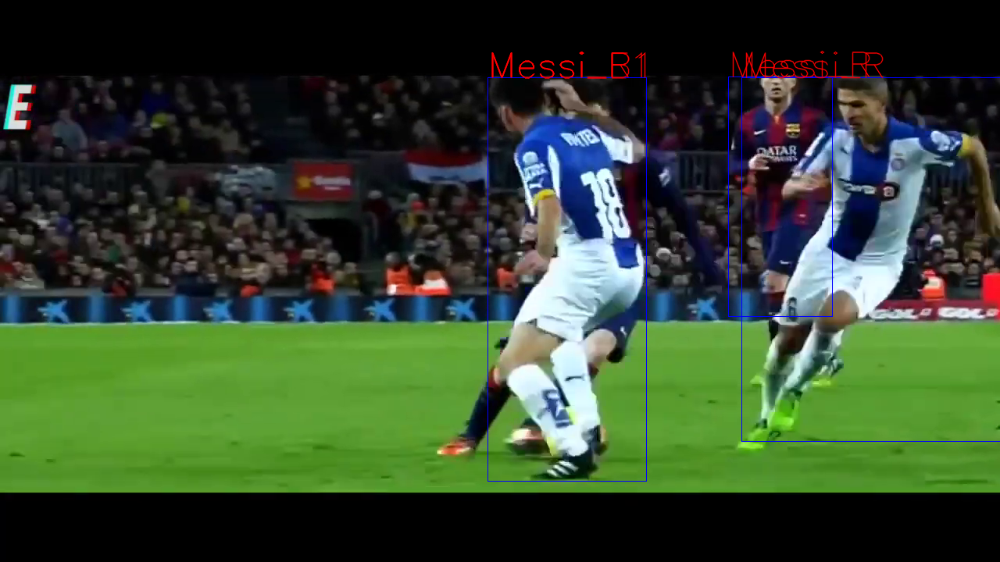


image 1/1 /MTM/MyDrive/template_matching/video/Leo_Frames/frame_0111.png: 768x1280 4 persons, 10382.7ms
Speed: 8.8ms preprocess, 10382.7ms inference, 2.0ms postprocess per image at shape (1, 3, 768, 1280)
asd :  4
body_bbox  body_bbox   :  [(529, 152, 224, 439), (928, 98, 282, 439), (891, 103, 128, 384), (694, 99, 212, 430)]
len(template_bbox) :  74
------------ body_keypoints        TemplateName       template_bbox     Score  \
0        Messi_R  (547, 416, 67, 83)  0.663847   
81       Messi_L  (616, 304, 86, 92)  0.563642   
10       Messi_R  (663, 164, 67, 83)  0.563427   
83       Messi_L  (620, 421, 86, 92)  0.560913   
18       Messi_R  (534, 168, 67, 83)  0.554530   
85       Messi_L   (862, 59, 86, 92)  0.554150   
102      Messi_L  (541, 318, 86, 92)  0.512566   

                                        body_keypoints                  BBox  
0    [[0.0, 0.0], [0.0, 0.0], [0.0, 0.0], [560.3405...  (529, 152, 224, 439)  
81   [[0.0, 0.0], [0.0, 0.0], [0.0, 0.0], [560.3405...  (

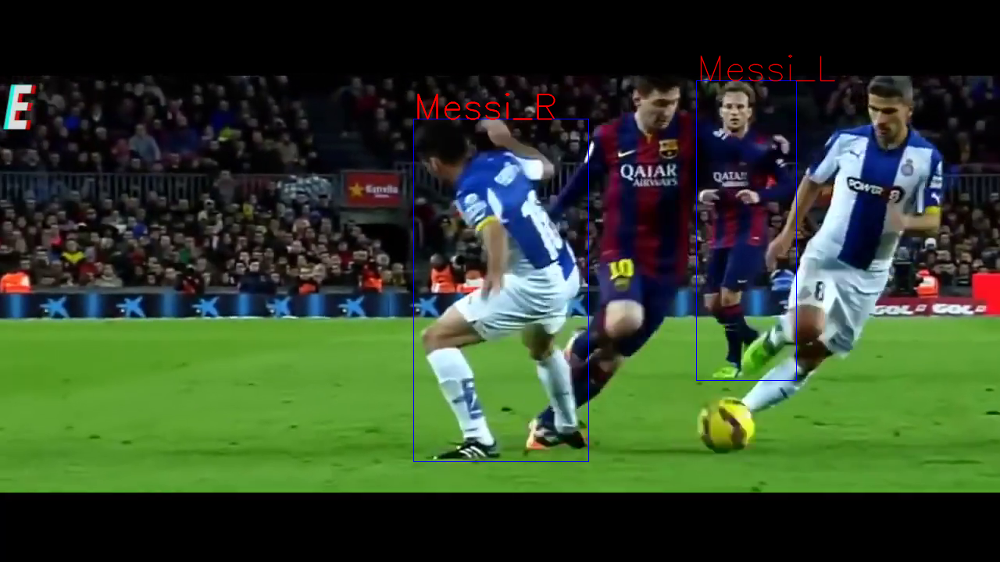


image 1/1 /MTM/MyDrive/template_matching/video/Leo_Frames/frame_0108.png: 768x1280 2 persons, 11227.2ms
Speed: 7.0ms preprocess, 11227.2ms inference, 1.6ms postprocess per image at shape (1, 3, 768, 1280)
asd :  2
body_bbox  body_bbox   :  [(582, 97, 294, 502), (249, 101, 442, 526)]
len(template_bbox) :  76
------------ body_keypoints        TemplateName       template_bbox     Score  \
54       Messi_L  (396, 222, 86, 92)  0.657844   
1        Messi_R  (349, 117, 67, 83)  0.634011   
4        Messi_R  (547, 344, 67, 83)  0.626188   
56       Messi_L  (456, 460, 86, 92)  0.624228   
8        Messi_R  (294, 429, 67, 83)  0.605183   
14       Messi_R  (696, 272, 67, 83)  0.577665   
16       Messi_R  (544, 447, 67, 83)  0.572308   
69       Messi_L  (748, 223, 86, 92)  0.568344   
26       Messi_R  (711, 166, 67, 83)  0.550974   
113     Messi_F1  (486, 183, 87, 97)  0.522841   
42       Messi_R  (595, 148, 67, 83)  0.519425   
50       Messi_R  (485, 266, 67, 83)  0.506611   
96       

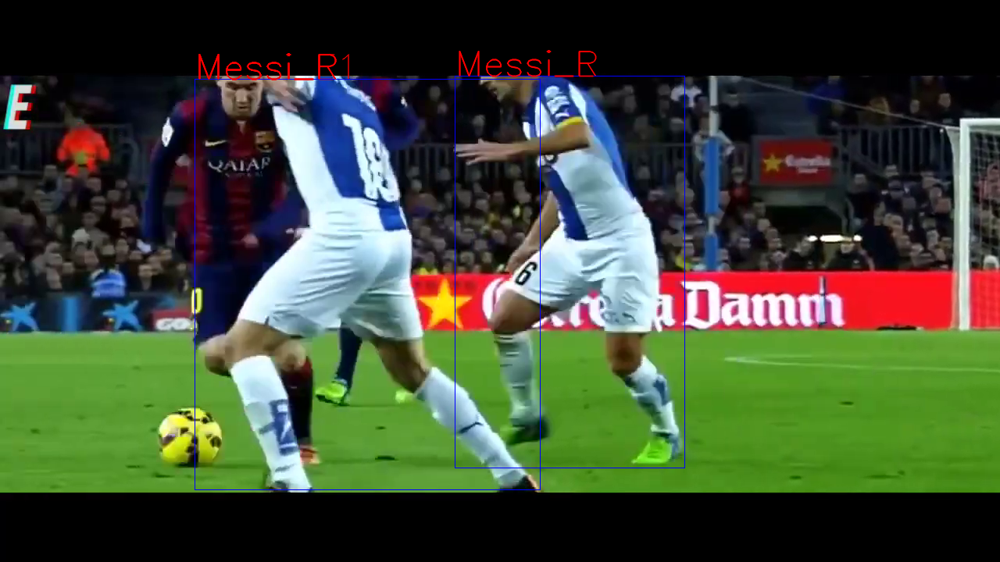


image 1/1 /MTM/MyDrive/template_matching/video/Leo_Frames/frame_0109.png: 768x1280 4 persons, 12127.5ms
Speed: 6.9ms preprocess, 12127.5ms inference, 1.6ms postprocess per image at shape (1, 3, 768, 1280)
asd :  4
body_bbox  body_bbox   :  [(707, 99, 302, 505), (488, 100, 244, 527), (286, 99, 286, 499), (683, 98, 117, 289)]
len(template_bbox) :  84
------------ body_keypoints       TemplateName       template_bbox     Score  \
0       Messi_R  (524, 424, 67, 83)  0.662210   
3       Messi_R   (772, 72, 67, 83)  0.652044   
4       Messi_R   (444, 64, 67, 83)  0.643373   
77      Messi_L  (578, 146, 86, 92)  0.599259   
14      Messi_R  (615, 461, 67, 83)  0.580913   
54      Messi_R  (652, 254, 67, 83)  0.504936   

                                       body_keypoints                  BBox  
0   [[0.0, 0.0], [0.0, 0.0], [0.0, 0.0], [523.8162...  (488, 100, 244, 527)  
3   [[790.1013793945312, 136.91458129882812], [799...   (707, 99, 302, 505)  
4   [[465.6796875, 104.47958374023438],

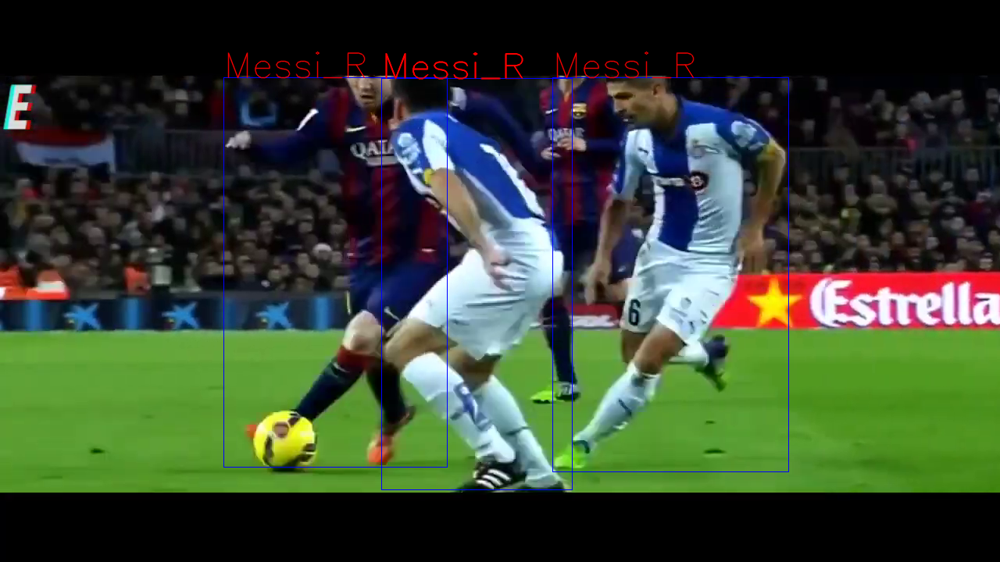


image 1/1 /MTM/MyDrive/template_matching/video/Leo_Frames/frame_0070.png: 768x1280 4 persons, 11028.2ms
Speed: 6.6ms preprocess, 11028.2ms inference, 1.9ms postprocess per image at shape (1, 3, 768, 1280)
asd :  4
body_bbox  body_bbox   :  [(68, 93, 303, 545), (1138, 92, 142, 486), (413, 119, 312, 485), (613, 158, 213, 434)]
len(template_bbox) :  80
------------ body_keypoints        TemplateName        template_bbox     Score  \
52       Messi_L   (149, 467, 86, 92)  0.672897   
4        Messi_R   (156, 321, 67, 83)  0.612564   
66       Messi_L   (501, 424, 86, 92)  0.600610   
84       Messi_L   (281, 382, 86, 92)  0.569762   
16       Messi_R   (272, 302, 67, 83)  0.564985   
17       Messi_R   (672, 498, 67, 83)  0.562676   
36       Messi_R   (748, 289, 67, 83)  0.544031   
150     Messi_F1    (99, 222, 87, 97)  0.541601   
37       Messi_R  (1201, 238, 67, 83)  0.538199   
151     Messi_F1   (498, 302, 87, 97)  0.537096   
47       Messi_R   (739, 377, 67, 83)  0.507107   

   

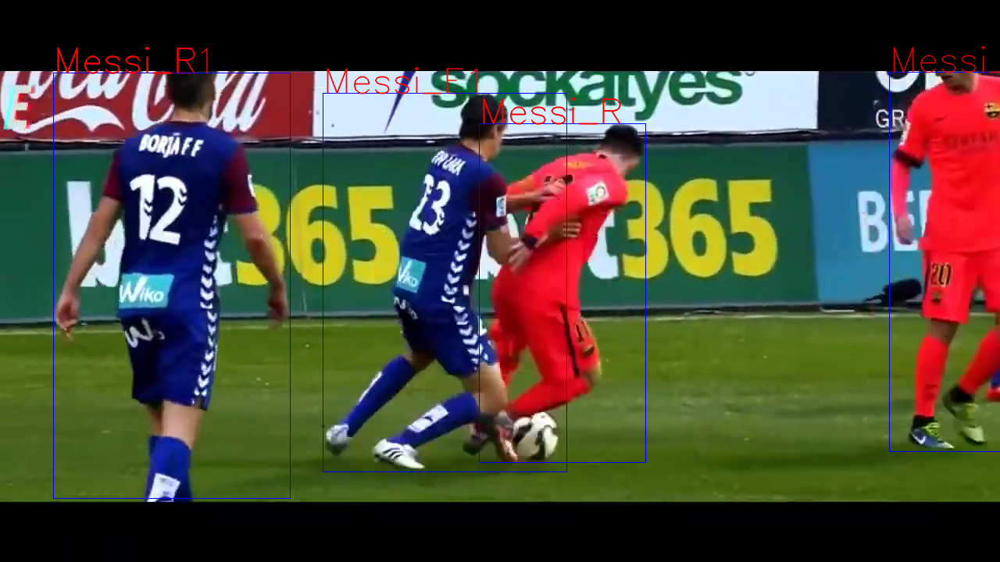

KeyboardInterrupt: ignored

In [196]:

template_folder ="/MTM/MyDrive/template_matching/images/messi_templates"
for img in imgs:
  # input_img="/MTM/MyDrive/template_matching/video/Leo_Frames/frame_0029.png"
  input_img=img
  hits = Multiple_Template_On_Image(template_folder, input_img)

  # body_bbox,body_keypoints=Extract_BBOX(input_img)
  body_bbox=standard_bbox(body_bbox)
  # print(body_keypoints)
  # print("body_bbox : ",body_bbox)
  df = Mapping_To_BBOX_Body_Keypoints(hits,body_keypoints,body_bbox)
  # Rename the 'OldColumn' to 'NewColumn'
  df.rename(columns={'BBox': 'template_bbox'}, inplace=True)
  df.rename(columns={'body_bbox': 'BBox'}, inplace=True)
  df['BBox'].replace('', np.nan, inplace=True)
  df=df.dropna()
  print("------------ body_keypoints   ",df)
  # df=df.dropna()
  Display_template_matching_output(df,input_img)

  columns = ['template_bbox', 'body_keypoints', 'body_BBox']
  bbox_points_df = pd.DataFrame(columns=columns)

# a = Insert_bbox_keypoints_frame_by_frame('frame_1',df,bbox_points_df)


In [174]:
df

,TemplateName,template_bbox,Score,body_keypoints,BBox
1,Messi_L,"(801, 276, 86, 92)",0.738155,"[[0.0, 0.0], [0.0, 0.0], [0.0, 0.0], [0.0, 0.0...","(506, 162, 517, 500)"


In [176]:
# df['BBox'].replace('', np.nan, inplace=True)
# df=df.dropna()

In [ ]:

def Insert_bbox_keypoints_frame_by_frame(frame,df,bbox_points_df):
  template_bbox_l=[]
  body_keypoints_l=[]
  body_BBox_l=[]
  for i in range(len(df["TemplateName"])):
    tmp_name=df["TemplateName"][i]

    template_bbox_dict={tmp_name:df["template_bbox"][i]}
    body_keypoints_dict={tmp_name:df["body_keypoints"][i]}
    body_BBox_dict={tmp_name:df["BBox"][i]}

    template_bbox_l.append(template_bbox_dict)
    body_keypoints_l.append(body_keypoints_dict)
    body_BBox_l.append(body_BBox_dict)

  bbox_points_df.loc[frame] = [template_bbox_l,body_keypoints_l,body_BBox_l]
  return bbox_points_df


columns = ['template_bbox', 'body_keypoints', 'body_BBox']
bbox_points_df = pd.DataFrame(columns=columns)

a = Insert_bbox_keypoints_frame_by_frame('frame_1',df,bbox_points_df)
# print(bbox_points_df)

In [ ]:
a

,template_bbox,body_keypoints,body_BBox
frame_1,"[{'temp_1': (401, 249, 42, 56)}, {'temp_2': (4...","[{'temp_1': [[419.37139892578125, 281.39724731...","[{'temp_1': (371, 254, 88, 295)}, {'temp_2': (..."


In [ ]:
df = pd.DataFrame(df)
df

,TemplateName,template_bbox,Score,body_keypoints,BBox
1,temp_2,"(459, 194, 66, 70)",0.999996,"[[473.3041076660156, 237.24847412109375], [478...","(414, 201, 183, 385)"
0,temp_1,"(401, 249, 42, 56)",0.999994,"[[419.37139892578125, 281.3972473144531], [424...","(371, 254, 88, 295)"


In [ ]:

# Save the DataFrame to a CSV file
df.to_csv('after_mapping.csv', index=False)
# Download the CSV file
from google.colab import files
files.download(df)


In [ ]:

# # Download the CSV file
# from google.colab import files
# files.download(df)


In [ ]:
listTemplate=[]
image_folder = "/MTM/MyDrive/template_matching/images/templates"
for filename in os.listdir(image_folder):
    template_img = cv2.imread(os.path.join(image_folder, filename))
    template_img = cv2.cvtColor(template_img, cv2.COLOR_BGR2GRAY)
    listTemplate.append((filename.split('.')[0], template_img))
listTemplate

[('temp_1',
  array([[ 50,  50,  50, ...,  52,  51,  50],
         [ 50,  50,  50, ...,  51,  51,  51],
         [ 50,  50,  50, ...,  51,  51,  51],
         ...,
         [ 81,  82,  81, ..., 157, 243, 104],
         [ 85,  86,  85, ..., 153, 251, 119],
         [ 88,  87,  90, ..., 150, 246, 125]], dtype=uint8)),
 ('temp_2',
  array([[ 58,  57,  57, ...,  54,  54,  55],
         [ 58,  58,  58, ...,  54,  54,  54],
         [ 59,  58,  58, ...,  53,  53,  54],
         ...,
         [ 53,  53,  54, ..., 252, 251, 252],
         [ 53,  53,  53, ..., 251, 254, 254],
         [ 53,  53,  54, ..., 250, 250, 254]], dtype=uint8))]

In [ ]:



input_img="/MTM/MyDrive/template_matching/images/frame_0003.jpeg"
input_img=cv2.imread(input_img)
input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY)

https://stackoverflow.com/questions/54442201/cv2-matchtemplate-gives-an-error-215assertion-failed

In [ ]:
hits = matchTemplates(listTemplate,
                      input_img,
                      score_threshold=0.8,
                      searchBox=(0, 0, 3000, 750),
                      method=cv2.TM_CCOEFF_NORMED,
                      maxOverlap=0.1)


In [ ]:
input_img="/MTM/MyDrive/template_matching/images/frame_0003.jpeg"
input_img=cv2.imread(input_img)
input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY)
hits = matchTemplates(listTemplate,
                      input_img,
                      score_threshold=0.7,
                      searchBox=(0, 0, 3000, 750),
                      method=cv2.TM_CCOEFF_NORMED,
                      maxOverlap=0.1)
hits

,TemplateName,BBox,Score
1,temp_2,"(459, 194, 66, 70)",0.999996
0,temp_1,"(401, 249, 42, 56)",0.999994


In [ ]:
import pandas as pd

# Sample DataFrame
data = {'TemplateName': ['temp_2', 'temp_1'],
        'BBox': [(459, 194, 66, 70), (401, 249, 42, 56)],
        'Score': [0.999996, 0.999994]}

df = pd.DataFrame(data)

# Add new empty columns
df['XMin'] = df['BBox'].apply(lambda x: x[0])
df['YMin'] = df['BBox'].apply(lambda x: x[1])
df['Width'] = df['BBox'].apply(lambda x: x[2])
df['Height'] = df['BBox'].apply(lambda x: x[3])

# Display the updated DataFrame
print(df)


  TemplateName                BBox     Score  XMin  YMin  Width  Height
0       temp_2  (459, 194, 66, 70)  0.999996   459   194     66      70
1       temp_1  (401, 249, 42, 56)  0.999994   401   249     42      56


In [ ]:
import pandas as pd
import numpy as np

# Create a sample DataFrame
data = {'Column1': [1, 2, 3],
        'Column2': ['A', 'B', 'C']}
df = pd.DataFrame(data)

# Add a new empty column with NaN values named 'NewColumn'
df['NewColumn'] = np.nan

# Display the updated DataFrame
print(df)


   Column1 Column2  NewColumn
0        1       A        NaN
1        2       B        NaN
2        3       C        NaN


In [ ]:
a=hits
a

,TemplateName,BBox,Score
1,temp_2,"(459, 194, 66, 70)",0.999996
0,temp_1,"(401, 249, 42, 56)",0.999994


In [ ]:
def is_point_inside_bbox(template_df,body_keypoints,body_bbox):
  template_bbox=[]
  template_bbox = template_df["BBox"].tolist()
  for bbox in template_df["BBox"]:
    template_bbox.append(bbox)
  # print(template_bbox)
  template_df['body_keypoints']=''
  template_df['body_bbox']=''
  print("template_df : \n",template_df)
  for keypoints in body_keypoints:
    # print(keypoints)
    nose       = keypoints[0][0],  keypoints[0][1]
    l_eye      = keypoints[1][0],  keypoints[1][1]
    r_eye      = keypoints[2][0],  keypoints[2][1]
    # print("nose,l_eye,r_eye  :  ",nose,l_eye,r_eye)

    ck=0
    cnt=0
    for bbox in template_bbox:
      xmin, ymin, width, height = bbox
      xmax = xmin + width
      ymax = ymin + height
      # print("xmin,ymin,xmax,ymax : ",xmin,ymin,xmax,ymax)
      if xmin <= nose[0] <= xmax and ymin <= nose[1] <= ymax:
        ck=1
        cnt+=1
        break
      if xmin <= l_eye[0] <= xmax and ymin <= l_eye[1] <= ymax:
        ck=1
        cnt+=1
        break
      if xmin <= r_eye[0] <= xmax and ymin <= r_eye[1] <= ymax:
        ck=1
        cnt+=1
        break
      cnt+=1

    if(ck==1):
      #df.loc[df['Column2'] == 'B', 'NewColumn'] = 'NewValue'
      print("bbox : ",bbox,cnt)
      print("keypoints : ",keypoints)
      # Use apply to update 'body_keypoints' for matching rows
      template_df['body_keypoints'] = template_df.apply(
                lambda row: keypoints if (row['BBox'] == bbox) else row['body_keypoints'],
                axis=1
            )
      template_df['body_bbox'] = template_df.apply(
                lambda row: body_bbox[cnt] if (row['BBox'] == bbox) else row['body_bbox'],
                axis=1
            )

  return template_df

aa=[(414, 201, 597, 586), (591, 139, 805, 662), (371, 254, 459, 549)]
b_p=[[[473.30413818359375, 237.24847412109375], [478.2010192871094, 229.47496032714844], [0.0, 0.0], [498.2188415527344, 231.8009490966797], [0.0, 0.0], [515.9636840820312, 272.63433837890625], [503.31939697265625, 274.1712646484375], [505.3527526855469, 330.44818115234375], [0.0, 0.0], [464.5457763671875, 353.03094482421875], [0.0, 0.0], [517.9490966796875, 378.9803466796875], [499.75927734375, 377.59295654296875], [528.1143188476562, 472.73419189453125], [475.9798278808594, 468.8236083984375], [579.2402954101562, 553.2843627929688], [462.03411865234375, 558.9953002929688]], [[0.0, 0.0], [0.0, 0.0], [0.0, 0.0], [674.676025390625, 182.3291778564453], [716.325927734375, 181.14271545410156], [650.8536987304688, 241.10073852539062], [747.0170288085938, 242.65081787109375], [620.0415649414062, 324.4531555175781], [787.041015625, 323.5877685546875], [608.3579711914062, 398.8807067871094], [753.4920043945312, 357.9093933105469], [666.2969360351562, 380.8517761230469], [730.0779418945312, 382.0774841308594], [659.3068237304688, 504.6346435546875], [727.2190551757812, 505.10614013671875], [662.9187622070312, 628.3967895507812], [724.8833618164062, 623.403076171875]], [[419.37139892578125, 281.3972473144531], [424.9569091796875, 275.553955078125], [416.30712890625, 276.37054443359375], [438.2301025390625, 277.20269775390625], [0.0, 0.0], [443.394775390625, 308.0040588378906], [419.6802673339844, 308.8323059082031], [426.9999084472656, 354.17730712890625], [414.890625, 351.49603271484375], [392.20556640625, 369.6058654785156], [394.765625, 385.4115295410156], [435.84613037109375, 392.011962890625], [418.6187744140625, 389.365478515625], [425.41778564453125, 462.2489929199219], [410.33966064453125, 457.5269775390625], [438.7846984863281, 529.921142578125], [434.0665588378906, 509.62969970703125]]]
body_bbox=[(414, 201, 597, 586), (591, 139, 805, 662), (371, 254, 459, 549)]
template_df=is_point_inside_bbox(hits,b_p,body_bbox)
template_df

template_df : 
   TemplateName                BBox     Score body_keypoints body_bbox
1       temp_2  (459, 194, 66, 70)  0.999996                         
0       temp_1  (401, 249, 42, 56)  0.999994                         
bbox :  (459, 194, 66, 70) 1
keypoints :  [[473.30413818359375, 237.24847412109375], [478.2010192871094, 229.47496032714844], [0.0, 0.0], [498.2188415527344, 231.8009490966797], [0.0, 0.0], [515.9636840820312, 272.63433837890625], [503.31939697265625, 274.1712646484375], [505.3527526855469, 330.44818115234375], [0.0, 0.0], [464.5457763671875, 353.03094482421875], [0.0, 0.0], [517.9490966796875, 378.9803466796875], [499.75927734375, 377.59295654296875], [528.1143188476562, 472.73419189453125], [475.9798278808594, 468.8236083984375], [579.2402954101562, 553.2843627929688], [462.03411865234375, 558.9953002929688]]
bbox :  (401, 249, 42, 56) 2
keypoints :  [[419.37139892578125, 281.3972473144531], [424.9569091796875, 275.553955078125], [416.30712890625, 276.3705444335

,TemplateName,BBox,Score,body_keypoints,body_bbox
1,temp_2,"(459, 194, 66, 70)",0.999996,"[[473.30413818359375, 237.24847412109375], [47...","(591, 139, 805, 662)"
0,temp_1,"(401, 249, 42, 56)",0.999994,"[[419.37139892578125, 281.3972473144531], [424...","(371, 254, 459, 549)"


In [ ]:
template_df['body_keypoints'] = template_df.apply(
                lambda row: 12 if (row['BBox'] == bbox).all() else row['body_keypoints'],
                axis=1
            )

In [ ]:
import pandas as pd

# Create a sample DataFrame
data = {'Column1': [1, 2, 3],
        'Column2': ['A', 'B', 'C']}
df = pd.DataFrame(data)

# Add a new column named 'NewColumn' and set values based on the condition
df['NewColumn'] = ''  # Initialize with empty strings
df.loc[df['Column2'] == 'B', 'NewColumn'] = 'NewValue'

# Display the updated DataFrame
print(df)


   Column1 Column2 NewColumn
0        1       A          
1        2       B  NewValue
2        3       C          


In [ ]:
b=[(414.0, 201.0, 597.0, 586.0),
 (591.0, 139.0, 805.0, 662.0),
 (371.0, 254.0, 459.0, 549.0)]
b[0]

(414.0, 201.0, 597.0, 586.0)

In [ ]:
aa=[]
hits["BBox"][0]=b[0]
hits["BBox"]
for i in range(len(hits["BBox"])):
  aa.append(hits["BBox"][i])
aa

<ipython-input-78-6e1fc862492b>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  hits["BBox"][0]=b[0]


[(414.0, 201.0, 597.0, 586.0), (459, 194, 66, 70)]

In [ ]:
type(hits)
len(hits["BBox"])

2

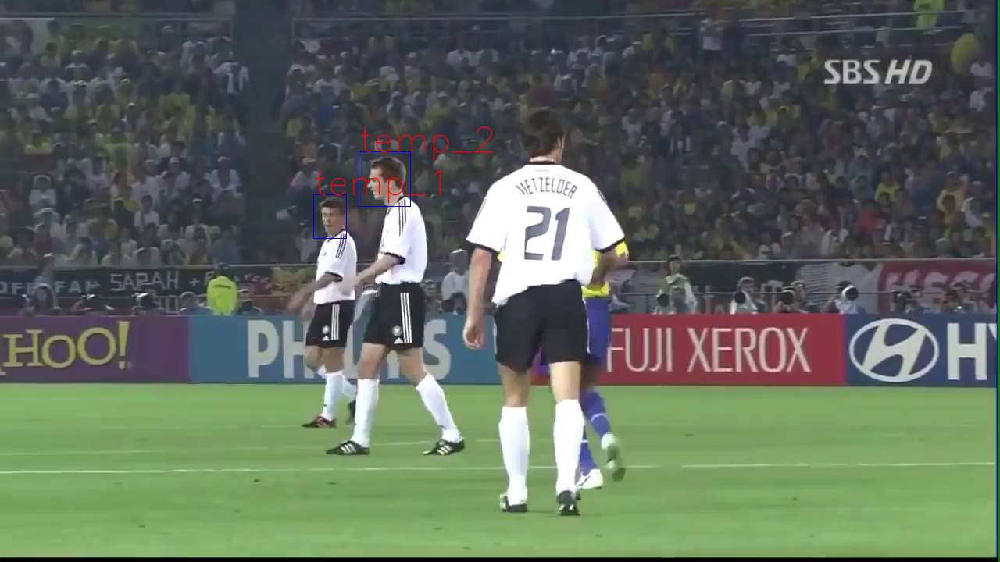

In [ ]:
input_img="/MTM/MyDrive/template_matching/images/frame_0003.jpeg"
input_img=cv2.imread(input_img)
input_img = cv2.cvtColor(input_img, cv2.COLOR_BGR2GRAY)
hits = matchTemplates(listTemplate,
                      input_img,
                      score_threshold=0.7,
                      searchBox=(0, 0, 3000, 750),
                      method=cv2.TM_CCOEFF_NORMED,
                      maxOverlap=0.1)

input_img="/MTM/MyDrive/template_matching/images/frame_0003.jpeg"
input_img=cv2.imread(input_img)

import matplotlib.pyplot as plt
from MTM import drawBoxesOnRGB
overlay = drawBoxesOnRGB(input_img,
                         hits,
                         showLabel = True,
                         labelColor=( 0, 0,255),
                         boxColor = (255, 0, 0),
                         labelScale=1.5,
                         boxThickness = 1)

# plt.imshow(overlay)
# plt.show()
cv2_imshow(overlay)
cv2.waitKey()
cv2.destroyAllWindows()

In [ ]:
def is_point_inside_bbox(point, bbox):
    x, y = point
    xmin, ymin, width, height = bbox
    xmax = xmin + width
    ymax = ymin + height

    if xmin <= x <= xmax and ymin <= y <= ymax:
        return True
    else:
        return False

# Example usage:
bbox = (10, 20, 30, 40)  # Replace with your actual bbox values
point_to_check = (150, 30)  # Replace with the point you want to check

if is_point_inside_bbox(point_to_check, bbox):
    print("Point is inside the bbox.")
else:
    print("Point is outside the bbox.")


Point is outside the bbox.
